# Network project



Data description:
    Data collected about Facebook pages (November 2017). These datasets represent blue verified Facebook page networks of different categories. Nodes represent the pages and edges are mutual likes among them.

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import csv
import random

from community import community_louvain
from networkx.algorithms.community import greedy_modularity_communities

We start by importing the software packages needed. The last two packages are especially important for modularity optimization. The packages are pre-set, and we will make use of them for comparing the outcome from step 3 with the best partition provided by the suggested software packages.

In [38]:
edges = pd.read_csv('fb-pages-food.edges')
nodes = pd.read_csv('fb-pages-food.nodes')

We import both files from our selected network 'fb-pages-food.edges' and 'fb-pages-food.nodes' in the pandas table format. 

In [39]:

with open('fb-pages-food.edges', newline='') as csvfile:
    data_edge = list(csv.reader(csvfile))

print(data_edge[:10])

[['0', '276'], ['0', '58'], ['0', '132'], ['0', '603'], ['0', '398'], ['0', '555'], ['1', '265'], ['1', '611'], ['2', '265'], ['2', '182']]


Then, we convert the 'fb-pages-food.edges' file into a matrix creating the array of 2-dimensional data. We are mapping each node to another, creating the corresponding edges. For instance, node 0 is connected with nodes 276, 58, 132, etc. 

In [40]:

edges_list = [[int(i[0]),int(i[1])] for i in data_edge]  


Next, we are generating a table with pandas to visualize the edges.  

In [41]:
edges_df = pd.DataFrame()
edges_df['e1'] = [i[1] for i in edges_list ]
edges_df['e2'] = [i[0] for i in edges_list ]
#edges_df.count()
edges_df.head()

,e1,e2
0,276,0
1,58,0
2,132,0
3,603,0
4,398,0


In the table, we can see that, i.e. node 0 has multiple connections.

In [42]:
print(len(nodes))
#nodes = nodes.set_index(['new_id'])
nodes = nodes.drop(columns = ['id'])
nodes.head()

620


,name,new_id
0,Josh Marks,386
1,Blue Ribbon Restaurants,473
2,Pat Neely,1
3,La Griglia,542
4,Jose Garces,189


The number of nodes amounts to 620. The name represents the name of the Facebook page.


In [43]:
nodes = nodes.sort_values(by=['new_id'])

Next, to verfiy if there are several facebook pages with an identical name,  we print an index. We can see that the name "Acapulcu" pops up several times

In [44]:
x = nodes.groupby(['name']).size()
for i in x:
    if i != 1:
        print( i, x.index[i])


2 Acapulco
2 Acapulco
2 Acapulco
4 Alain Ducasse
20 Anne-Sophie Pic
10 Alfred Portale
5 Alberto Chicote
2 Acapulco
10 Alfred Portale
27 Ben Sargent & Dr. Klaw
7 Alex Atala
59 Celler de Can Roca
15 Angel Leon Gonzalez
2 Acapulco
8 Alex French Guy Cooking


We launch the package "networkX". To plot a graph, we need to add the nodes and the edges.  

In [45]:
G = nx.Graph()

n = nodes['new_id']
n_name = nodes['name']


In [46]:
G.add_nodes_from(n)#add nodes to graph

G.add_edges_from(edges_list)#add edges to graph
#G.nodes.data() # visualize nodes data dictionary format
#G.edges.data()# visualize edges data dictionary format

To simplify the understanding of graphic plotting we want to inlcude the page names for each node. Thus, we create a dictionary fro the mapping.

In [47]:

dictionary = {}

for index, row in nodes.iterrows():
    dictionary[row['new_id']] = row['name']


print(dictionary) 


{0: 'Lee Anne Wong', 1: 'Pat Neely', 2: 'Ben Sargent & Dr. Klaw', 3: 'Chef Carlo Cracco', 4: 'George Pagonis', 5: 'Magnum', 6: 'Jumia Food', 7: 'Roy Yamaguchi', 8: "Chili's Grill & Bar", 9: 'José Andrés', 10: 'Big Fernand', 11: 'Taco Bell Panamá', 12: "Dunkin' Donuts", 13: 'Eckart Witzigmann', 14: 'Boston Market', 15: 'Christina Tosi', 16: "Domino's Pizza", 17: 'Ernst Knam', 18: 'NishaMadhulika', 19: 'Nutella Cafe Chicago', 20: 'Maria Loi', 21: "Domino's Pizza", 22: 'Delverde', 23: 'Dean Fearing', 24: "Nando's", 25: 'KFC', 26: 'foodpanda', 27: "McDonald's Vietnam", 28: "Nando's", 29: 'Bahama Breeze Island Grille', 30: "Nando's PERi-PERi", 31: "McDonald's", 32: 'Sanjeev Kapoor', 33: "Lillie's Asian Cuisine", 34: 'Chef Shirley Chung', 35: 'Chef Robert Irvine', 36: 'Ravintola Salve', 37: 'Russell Jackson', 38: "McDonald's", 39: 'Chef Mary Sue Milliken', 40: 'Chef Hirohiko Shoda', 41: 'Matt Moran', 42: 'KFC', 43: 'Roy Choi', 44: 'Kirti Bhoutika', 45: "McDonald's", 46: 'Per Se', 47: 'Hard R

In [48]:
G = nx.relabel_nodes(G, dictionary, copy=False)
sorted(G, key=str)
print('Done')

Done


To plot the graph, we call nx.draw. "G" is the graph. 

Options allow us to further adjust the setting of the graph. E.g., we selected pink as the color for the nodes and 10 as the font size for the labels. 

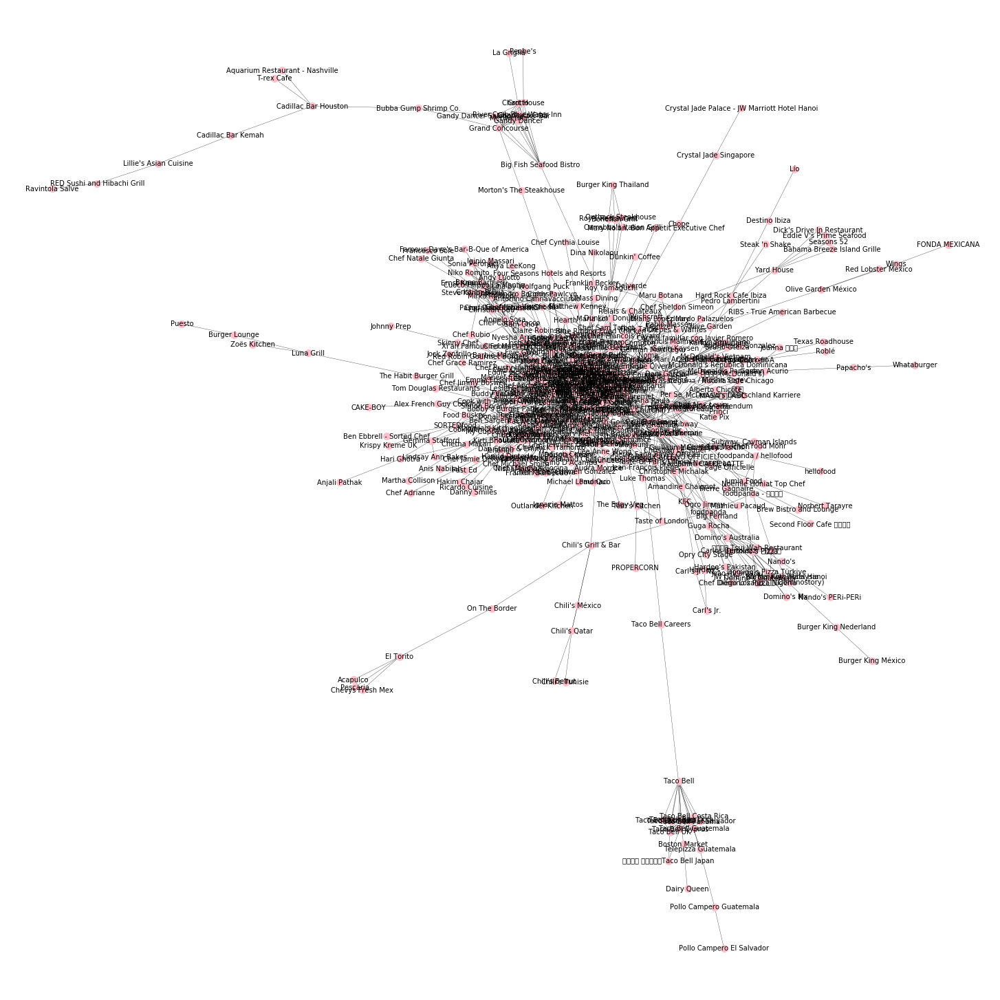

In [50]:

options = {'node_color': 'pink','node_size': 100,'width': 0.3,'with_labels':True,'font_weight':3,'font_size':10}
plt.figure(figsize = (20,20))

nx.draw(G, **options) #draw graph

plt.savefig("path.png")#save figure


We can examine the nodes and edges. Four basic graph properties facilitate reporting: G.nodes, G.edges, G.adj and G.degree. These are set-like views of the nodes, edges, neighbors (adjacencies), and degrees of nodes in a graph. They offer a continually updated read-only view into the graph structure. They are also dict-like in that you can look up node and edge data attributes via the views and iterate with data attributes using methods .items(), .data('span'). If you want a specific container type instead of a view, you can specify one. Here we use lists, though sets, dicts, tuples and other containers may be better in other contexts.

Analyzing graphs
The structure of G can be analyzed using various graph-theoretic functions such as:

In [16]:

degrees = G.degree()


We then specify the degrees. Degrees refer to the number of connections each node has. Moreover, we define a threshold plotting only the facebook pages which have more than 25 connections.

In [17]:
degree =  sorted([n,d] for n, d in degrees if d>25)
degree

[['Alex Guarnaschelli', 47],
 ['Bobby Flay', 31],
 ['Chef Daniel Boulud', 47],
 ['Chef Elizabeth Falkner', 29],
 ['Chef Jet Tila', 31],
 ['Chef Kent Graham', 43],
 ['Dani García', 33],
 ['David Chang', 56],
 ['Dining with Flynn', 26],
 ['Elizabeth Karmel', 27],
 ['Emily Ellyn', 30],
 ['Eric Ripert', 55],
 ['Geoffrey Zakarian', 30],
 ['Jacques Pépin', 32],
 ['José Andrés', 28],
 ['Logan Junior Chef', 134],
 ['Marcus Samuelsson', 31],
 ['Michel Nischan', 26],
 ['René Redzepi', 35],
 ['Robin Miller', 47],
 ['Scott Conant', 51],
 ['Tom Colicchio', 37]]

We obtain a partitioning of the network which is represented by the clusters.

In [18]:
cluster = nx.clustering(G)

In [19]:
cluster

{'Lee Anne Wong': 0.16666666666666666,
 'Pat Neely': 1.0,
 'Ben Sargent & Dr. Klaw': 1.0,
 'Chef Carlo Cracco': 0.2222222222222222,
 'George Pagonis': 0.3333333333333333,
 'Magnum': 0.08333333333333333,
 'Jumia Food': 0.16666666666666666,
 'Roy Yamaguchi': 0.23809523809523808,
 "Chili's Grill & Bar": 0.1,
 'José Andrés': 0.3439153439153439,
 'Big Fernand': 0,
 'Taco Bell Panamá': 0.9333333333333333,
 "Dunkin' Donuts": 0.25,
 'Eckart Witzigmann': 0,
 'Boston Market': 0,
 'Christina Tosi': 0.5777777777777777,
 "Domino's Pizza": 0.24444444444444444,
 'Ernst Knam': 0.4,
 'NishaMadhulika': 0,
 'Nutella Cafe Chicago': 0,
 'Maria Loi': 0,
 'Delverde': 0,
 'Dean Fearing': 0.16483516483516483,
 "Nando's": 0,
 'KFC': 0,
 'foodpanda': 0.022222222222222223,
 "McDonald's Vietnam": 0,
 'Bahama Breeze Island Grille': 0,
 "Nando's PERi-PERi": 0,
 "McDonald's": 0.015810276679841896,
 'Sanjeev Kapoor': 0.2857142857142857,
 "Lillie's Asian Cuisine": 0,
 'Chef Shirley Chung': 0.3333333333333333,
 'Chef Ro

## Step 3
We split the network in two communities.  A network is said to have community structure if the nodes of the network can be easily segmented into sets of nodes such that they are densely connected internally. In many real networks, nodes seem to appear in sub-networks in which the density of internal links is larger than the connections with the rest of nodes in the network.
First, we will create a new graph, called "H".

In [20]:
#pip install -U git+https://github.com/taynaud/python-louvain.git@networkx2

In [53]:
H = nx.Graph()
n = nodes['new_id']
n_name = nodes['name']
H.add_nodes_from(n)
H.add_edges_from(edges_list)



In [54]:
#pip install python-louvain

We will relabel the nodes and use the dictionary to sort the nodes. We will plot the graph using distinct colors for each community, such as to differentiate them.
We start with the Louvain method to extract communities from the network. The method is a greedy optimization method which first finds small communities by optimizing modularity locally on all nodes. Then each small community is grouped into one node and the first step is repeated.
The code used is similar to the previous method, with the difference that this time we apply a list which includes the partion values as the node color.

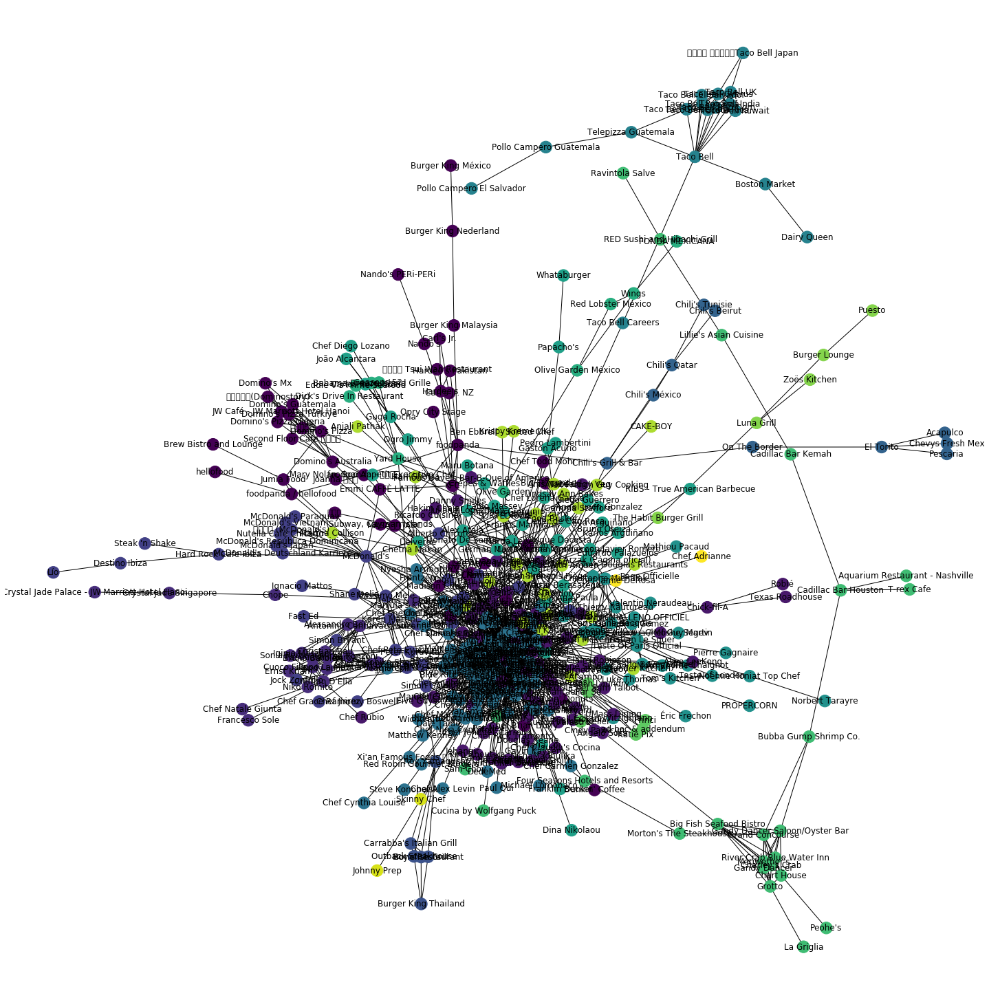

In [55]:
U = nx.relabel_nodes(H, dictionary, copy=False)
sorted(U, key=str)



partition = community_louvain.best_partition(U)#output -> dictionary

plt.figure(figsize=(20,20))



#U = nx.relabel_nodes(H, dictionary, copy=False)
#sorted(U, key=str)
nx.draw(U ,node_color=list(partition.values()),  with_labels= True); plt.show()

The partition is the result from the community_louvain.best_partition package. It takes each node and assigns it to a specific communitiy. We deem the results to be viable as the nodes that are closer together are clustered in one group.

In [63]:

N = 3
out = dict(list(partition.items())[0: N]) # Get first 3 items in dictionary  
out

{'Lee Anne Wong': 0, 'Pat Neely': 1, 'Ben Sargent & Dr. Klaw': 1}

Now, we will apply a different package called "greedy_modularity_communities" for the modularity optimization. The package finds communities in graph using Clauset-Newman-Moore greedy modularity maximization. This method currently supports the Graph class and does not consider edge weights.
We create another dictionary, called dic3. Each node is assigned to a specific community. Also, we will now use de greedy modularity.

In [64]:
c = list(greedy_modularity_communities(G))
c = np.array(c)

In [69]:
dic3 = {}

for k in range(len(c)):
    for i in c[k]:
        dic3[i] = k
N = 3
out = dict(list(dic3.items())[0: N]) # Get first 3 items in dictionary  
out

{'Fabio Viviani': 0, "Xi'an Famous Foods 西安名吃": 0, 'Hubert Keller': 0}

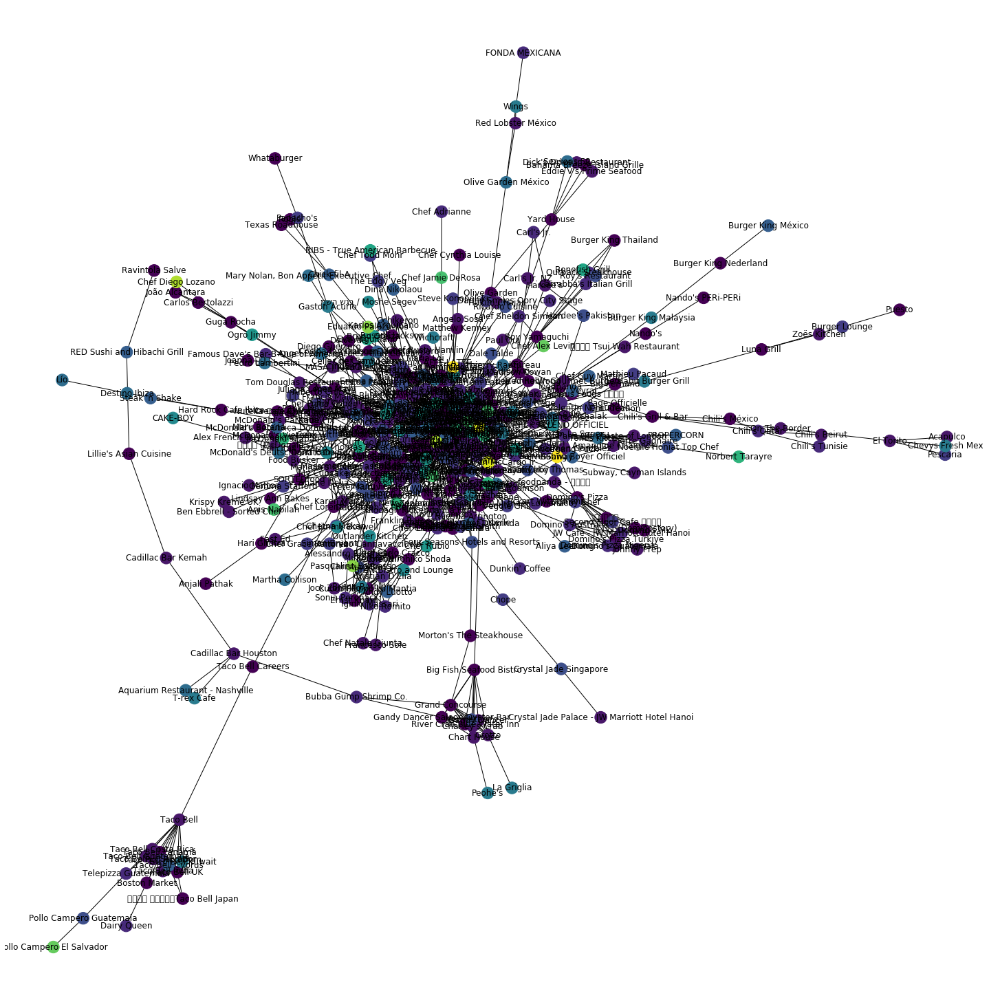

In [70]:

partition = dic3
#pos = community_layout(g, partition)
plt.figure(figsize=(20,20))
nx.draw(G, node_color=list(partition.values()), with_labels= True); plt.show()

The results seem not to be as good as with the previous modularity optimization method. While we obtain partitins, there seem to be several nodes that are far-spread and do not belong to the community.

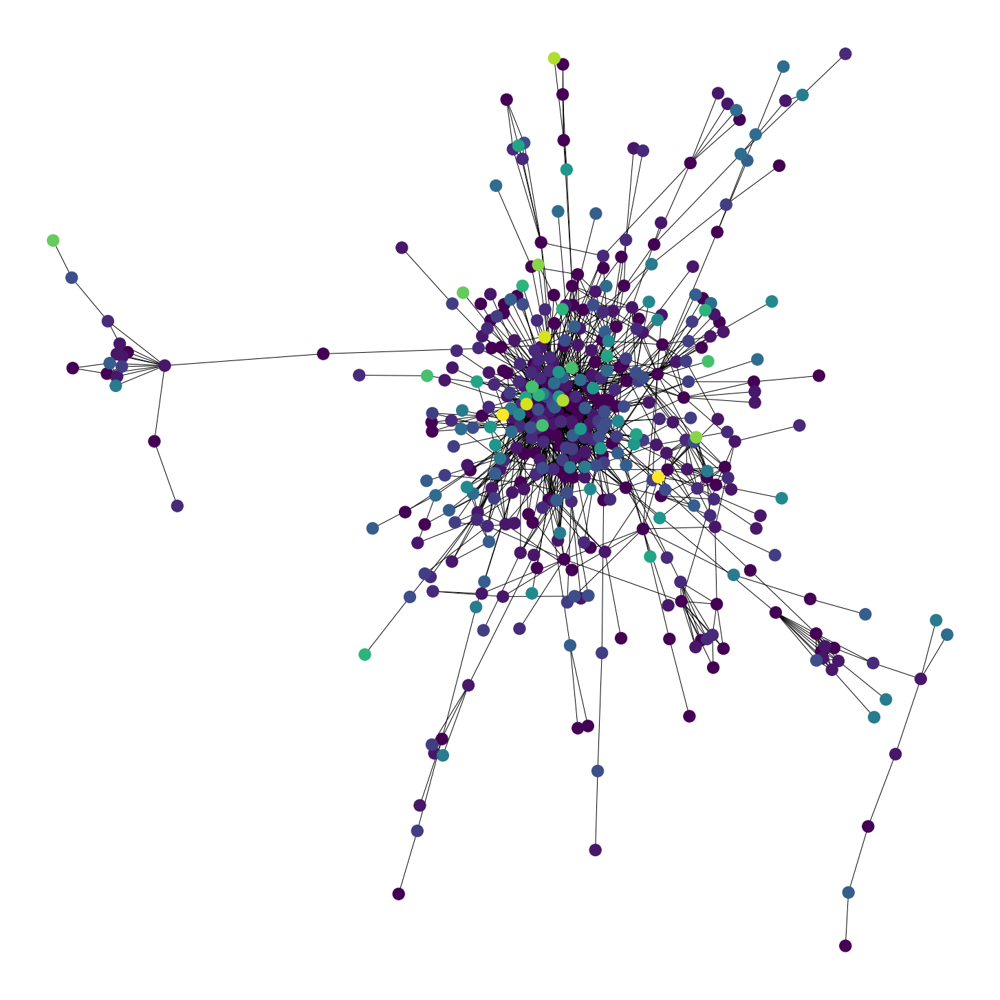

In [29]:

partition = dic3
#pos = community_layout(g, partition)
plt.figure(figsize=(20,20))
nx.draw(G, node_color=list(partition.values()), with_labels= False); plt.show()

# Summary of the Analysis Performed
### Randomly select partition of a network

The following code is used to create a new graph. The steps are the same as before. First, we create a graph. Then we add the nodes and define the edges. Below we provide an example containing seven nodes (whihc we decided) deciding the number of edges each node would have.
This example will help as evaluate the performance of our code.


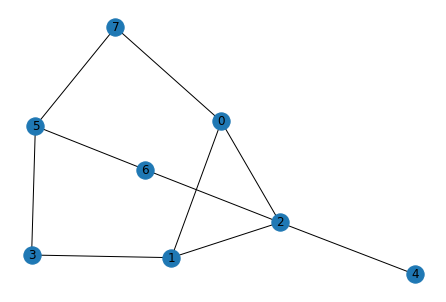

In [74]:
from networkx.algorithms.community import greedy_modularity_communities


A = nx.Graph()
A.add_nodes_from([0,1,2,3,4,5,6,7])


A.add_edges_from([(1,2),(1,3),(1,0),(2,0),(4,2),(5,7),(6,2),(5,3),(7,0),(5,6)])

nx.draw(A,with_labels= True  )

### Definition of Modularity function

#### Modularity refers to the concept of making multiple modules first and then linking and combining them to form a complete system (i.e, the extent to which a software/Web application may be divided into smaller modules is called modularity). Modularity enables re-usability and will minimize duplication.
This will serve us to compute modularity in our network

In [75]:

def modularity(partition, graph, weight='weight'):
 
    if type(graph) != nx.Graph:
        raise TypeError("Bad graph type, use only non directed graph")

    inc = dict([])
    deg = dict([])
    links = graph.size(weight=weight)
    if links == 0:
        raise ValueError("A graph without link has an undefined modularity")

    for node in graph:
        com = partition[node]
        deg[com] = deg.get(com, 0.) + graph.degree(node, weight=weight)
        for neighbor, datas in graph[node].items():
            edge_weight = datas.get(weight, 1)
            if partition[neighbor] == com:
                if neighbor == node:
                    inc[com] = inc.get(com, 0.) + float(edge_weight)
                else:
                    inc[com] = inc.get(com, 0.) + float(edge_weight) / 2.

    res = 0.
    for com in set(partition.values()):
        res += (inc.get(com, 0.) / links) - \
               (deg.get(com, 0.) / (2. * links)) ** 2
    return res


### Solving the Problem

We start defining the partition function creating a dictionary. The function randomly assigns each node to a community.
For our exercise, we want to have 2 communities.
It takes the nodes of the graph and it will iterate over the list node for node. It will randomly assign a number between 0 and 1. This helps us create two distinct communities.

However,  to find the maximum modularity we will have to improve the partitioning that has being initialized randomly. To do so, we will take the initial partitioning and make small changes to the assignment of nodes to a community. The function partition_one_change will take pairs of nodes and change their communities.

In [76]:
def partition_init(graph):
    d = np.array(graph.nodes)
    dicc = {}
    
    for i in d:
        dicc[i] = np.random.randint(2)

    return dicc

def partition_one_change(graph, partition):
    d = partition
    dicc = d.copy()
        
    random_choos1 = np.random.randint(len(dicc))#randomly choose 2 positions and switch them
    random_choos2 = np.random.randint(len(dicc))
    x = dicc[random_choos1]
    y = dicc[random_choos2]
    dicc[random_choos1] = y
    dicc[random_choos2] = x
       
    
    return dicc


partition_one_change(A, partition_init(A))
#modularity(A,old_partition, weight='weight') 

{0: 1, 1: 0, 2: 1, 3: 0, 4: 0, 5: 1, 6: 1, 7: 1}

### Comparing Modularity

The next function is used to compare the modularity of different partitions. It takes the old partition which is the first iteration will correspond to the partition_init (initializing randomly partition). We then create a new partition where two pair changes are added. Next, we compute the modularity for the old and the new one.
If the new modularity is greater than the old modularity, the selected becomes the new modularity and the new partition. Otherwise, we will keep the old modularity and the old partition. The same applies to the partitions (dictionaries).

In [77]:
def modularity_of_a_partition(graph , partition):
    old_partition = partition
    new_partition = partition_one_change(graph, partition)
    old_mod = modularity(old_partition,graph, weight='weight') 
    new_mod = modularity(new_partition,graph,  weight='weight')
    
    if new_mod > old_mod:
        mod = new_mod
        part = new_partition
    else :
        mod = old_mod
        part = old_partition
  
    return mod,part




### Iteration
We start with a random choice and we choose an iteration range to compute modularity. After that, it gives us the result of the modularity that we visualy graph and that over the steps keeps getting bigger. However due to the low number of nodes, the solutions are relatively similar among all of them since it is "quick" to arrive to the best solution.
Once this step is complete, we can iterate. For the range of the iteration we select 10 and compute the modularity. 

-0.1799999999999999


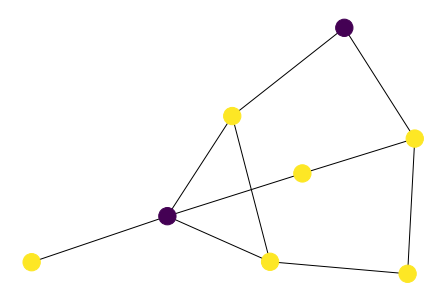

0.07499999999999998


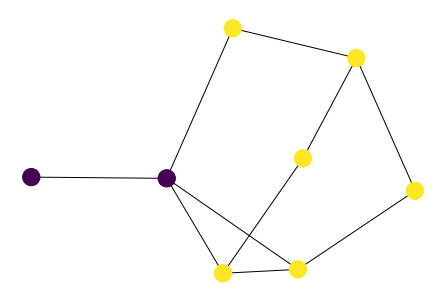

In [83]:
part_0 = partition_init(A)

for i in range(10):
    
    modul = modularity_of_a_partition(A, part_0)
    
    part_0 = modul[1]
    if  i %5 == 0 :
        print(modul[0])
        nx.draw(A, node_color=list(part_0.values())); plt.show()
    


### Trial
We wanted to try with a bigger number of nodes and we used a pre-set graph (karate_club_graph) as an example. The used code was applied and we were able to see how over time modularity increased and the split was more homogenous.

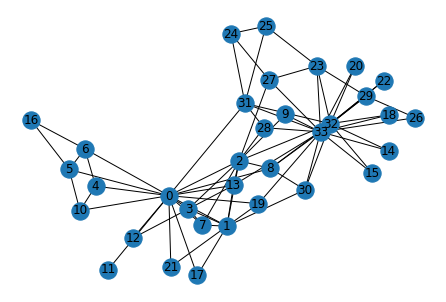

In [84]:
from networkx.algorithms.community import greedy_modularity_communities

B = nx.karate_club_graph()
nx.draw(B,with_labels= True  )

The same code is used with the difference that we define the range of iteration as 1000. 

-0.1210552268244576


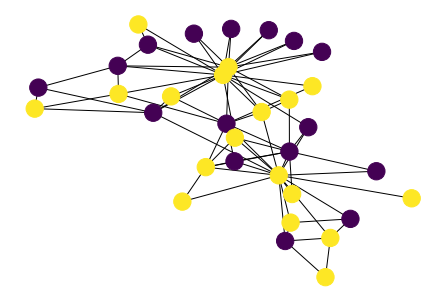

0.2692307692307693


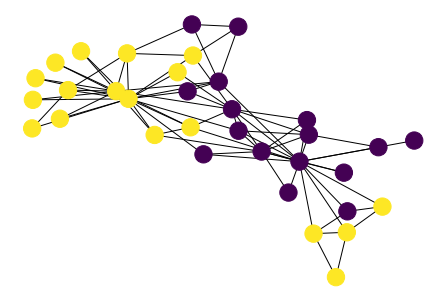

0.2692307692307693


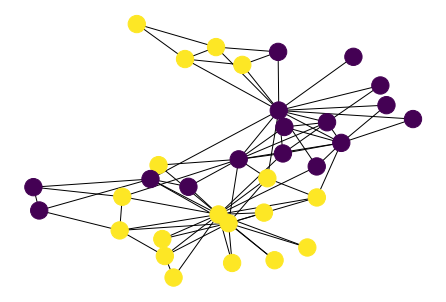

0.2819690992767916


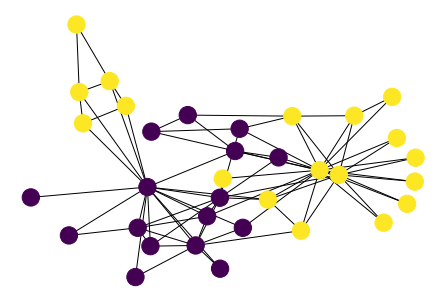

In [37]:
part_0 = partition_init(B)

for i in range(1000):
    
    modul = modularity_of_a_partition(B, part_0)
    #print(modul[0])
    part_0 = modul[1]
    
    if  i %320  == 0 :
        print(modul[0])

        nx.draw(B, node_color=list(part_0.values())); plt.show()

## Working with our network
We tested our code on our network selected 


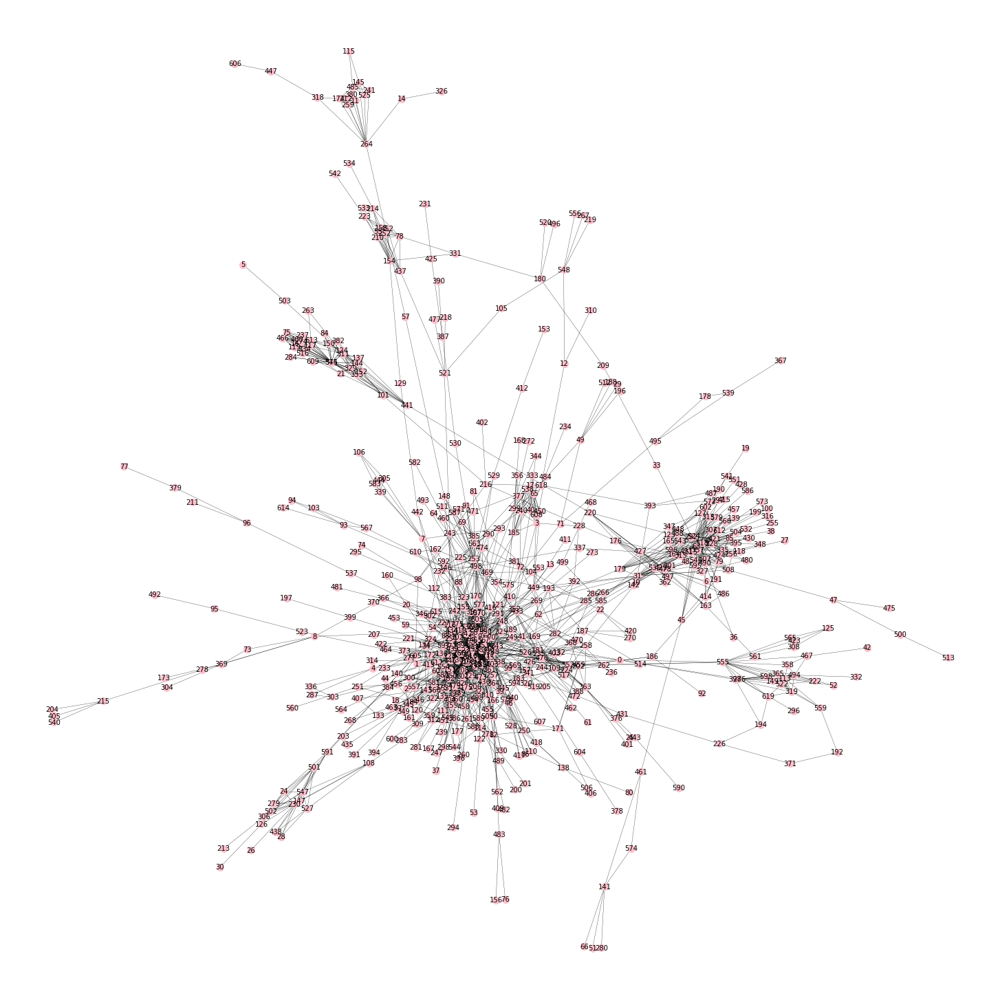

In [38]:
D = nx.Graph()
n_D = nodes['new_id']
n_name_D = nodes['name']
D.add_nodes_from(n_D)
D.add_edges_from(edges_list)


options = {'node_color': 'pink','node_size': 100,'width': 0.3,'with_labels':True,'font_weight':3,'font_size':10}
plt.figure(figsize = (20,20))

nx.draw(D, **options)

plt.savefig("path_finalfig.png")


As we iterate (the range is set to 10,000) the modularity is optimized.

0.012669620070957732


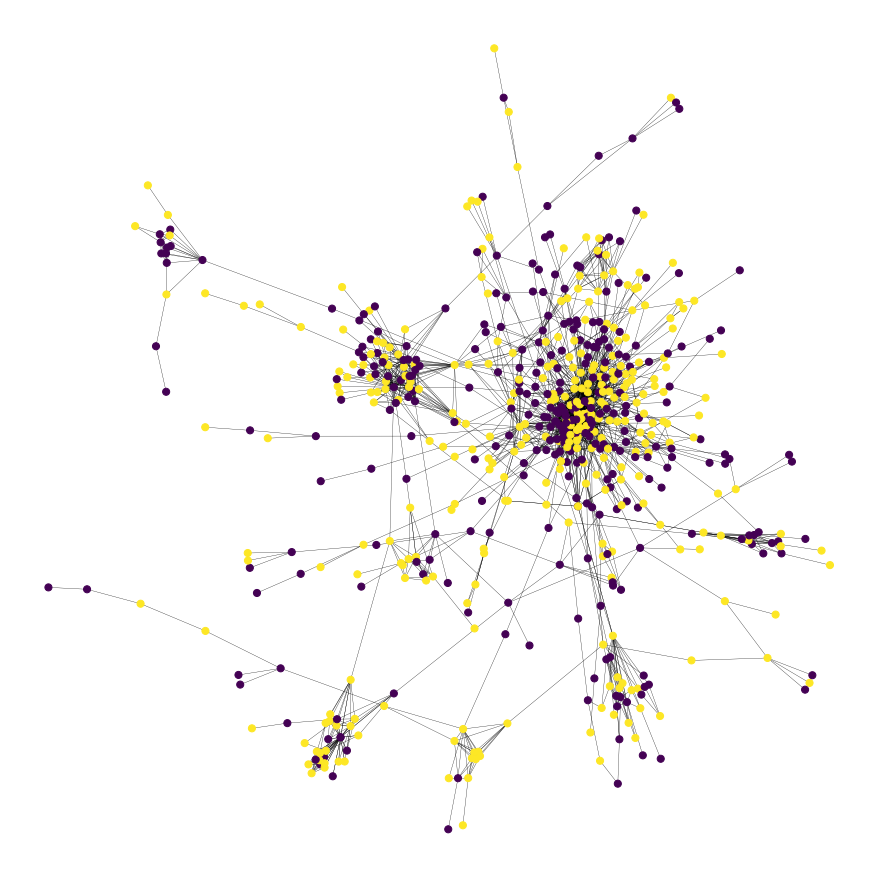

0.3190562700920966


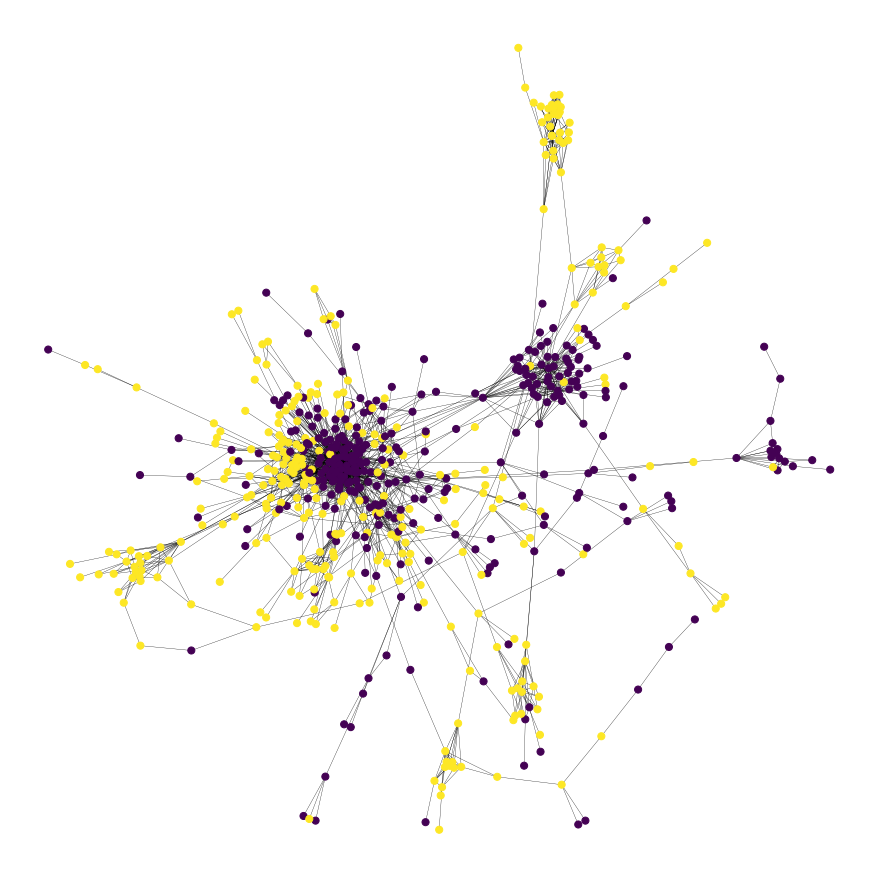

In [39]:
part_0 = partition_init(D)

for i in range(10000):
    
    modul = modularity_of_a_partition(D, part_0)
    #print(modul[0])
    part_0 = modul[1]
    
    if  i %5200  == 0 :
        print(modul[0])
        plt.figure(figsize = (12,12))
        nx.draw(D, node_color=list(part_0.values()),node_size = 50,width= 0.3); plt.show()


Over the time with the different itterations, the modularity increases and the split becomes more clear

-0.0036501868095357715


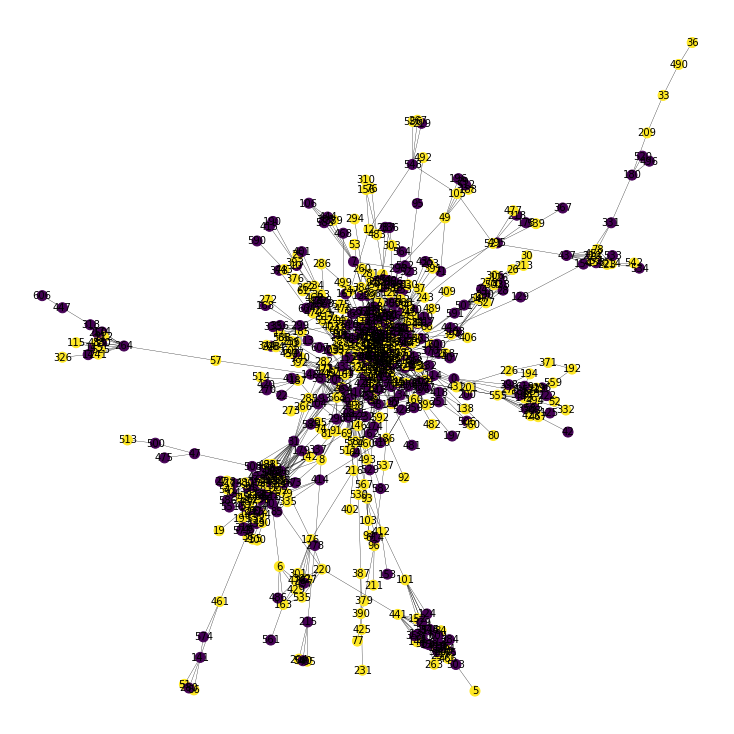

0.10852606506783893


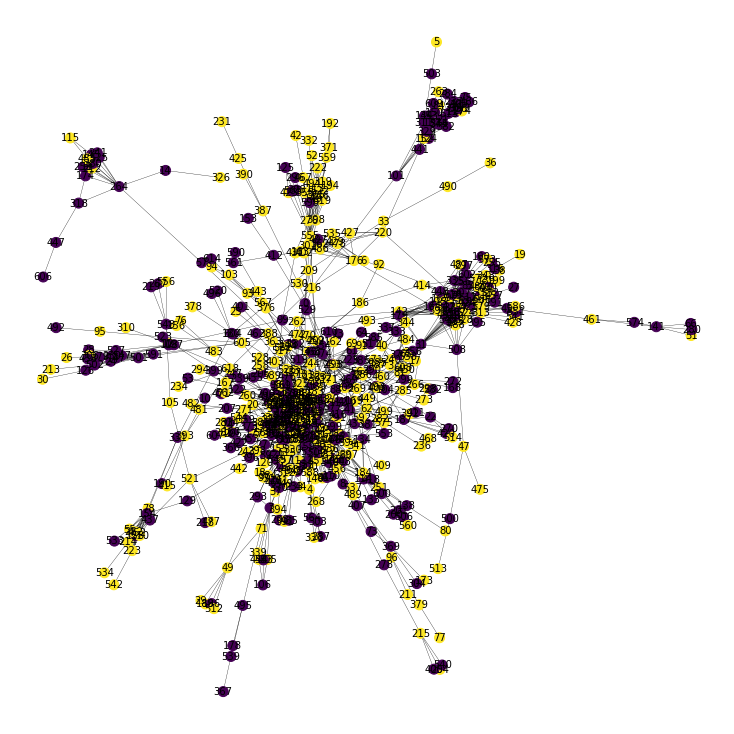

0.16073360426072397


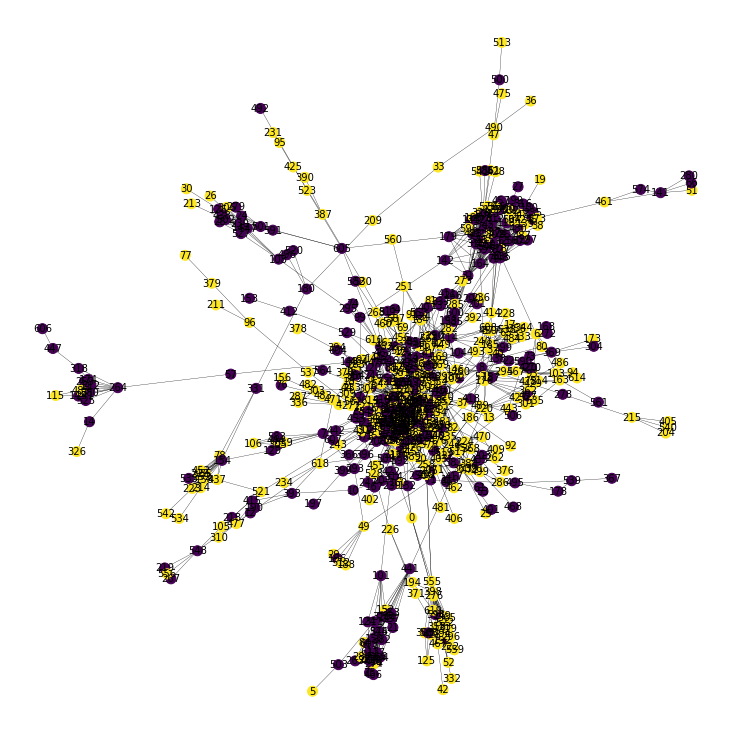

0.20465896735563335


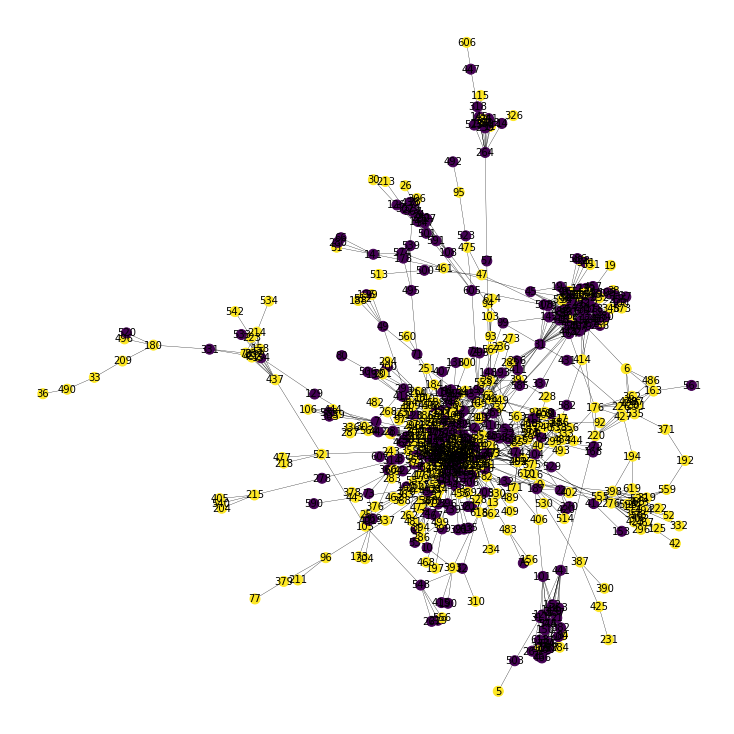

0.23661654751353647


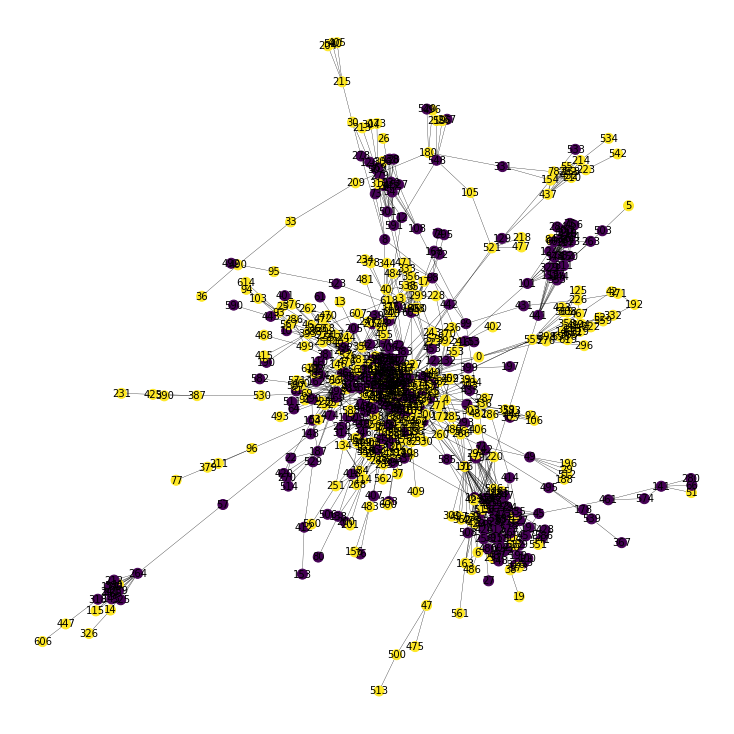

0.26024408361028095


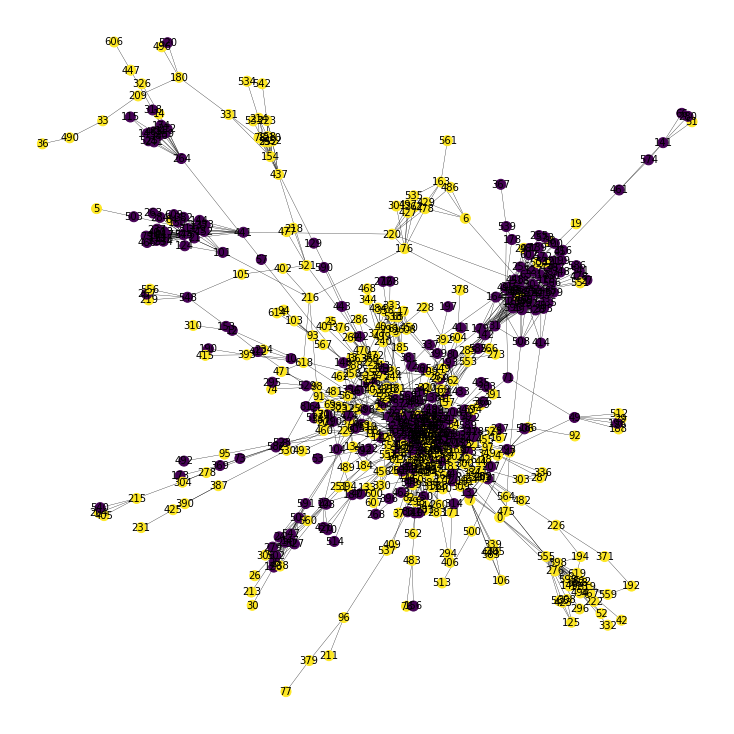

0.27857117637952533


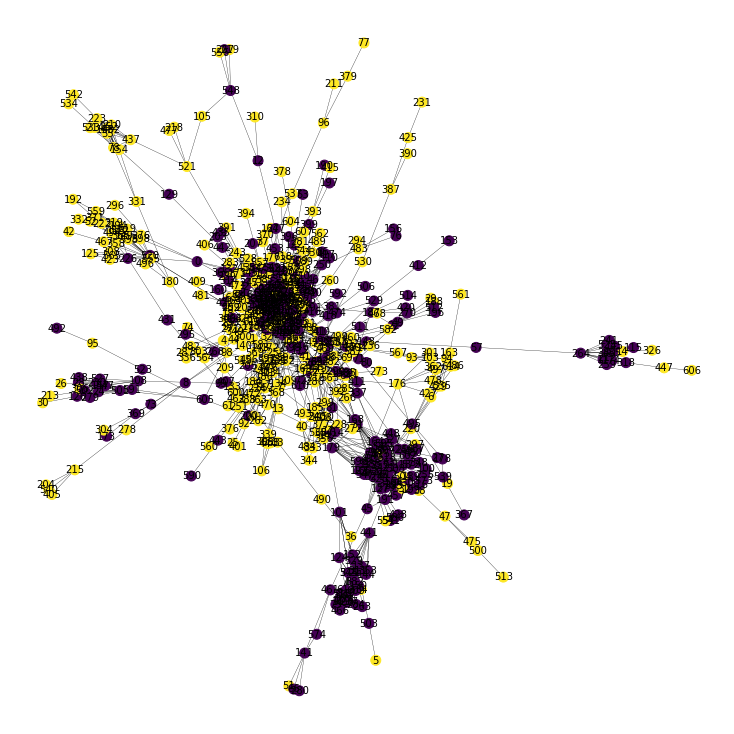

0.2905663447706457


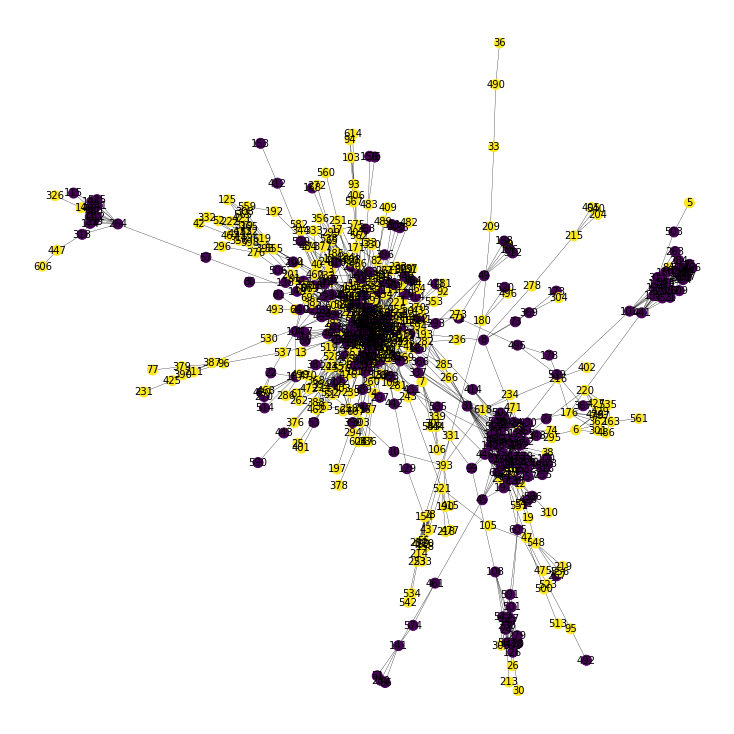

0.29328282339052736


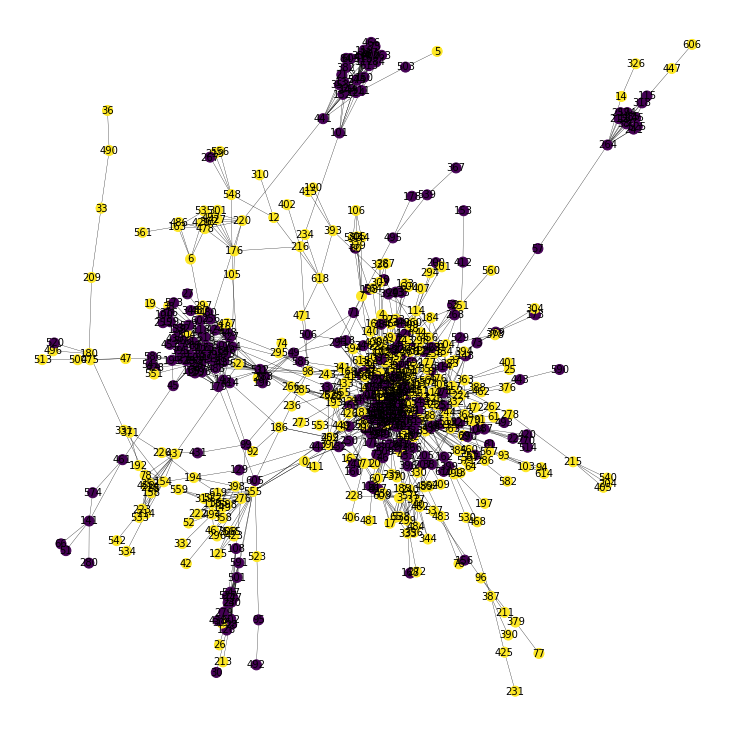

0.29762828387807005


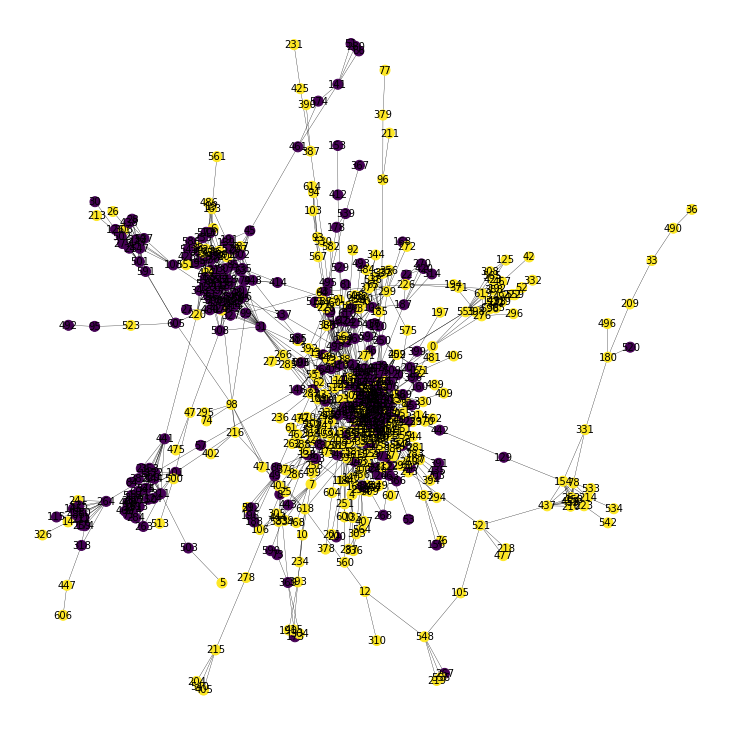

0.3033955247188803


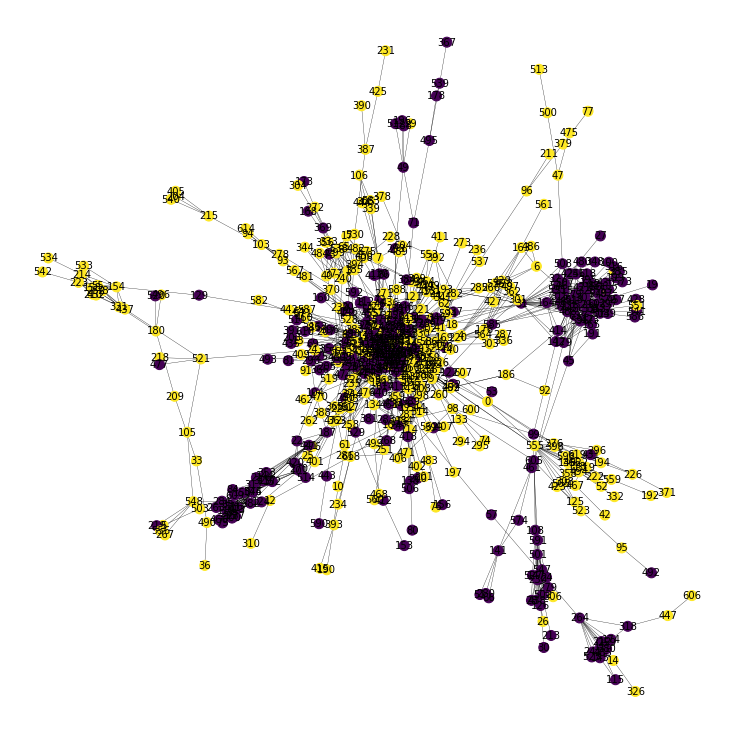

0.30376205978448323


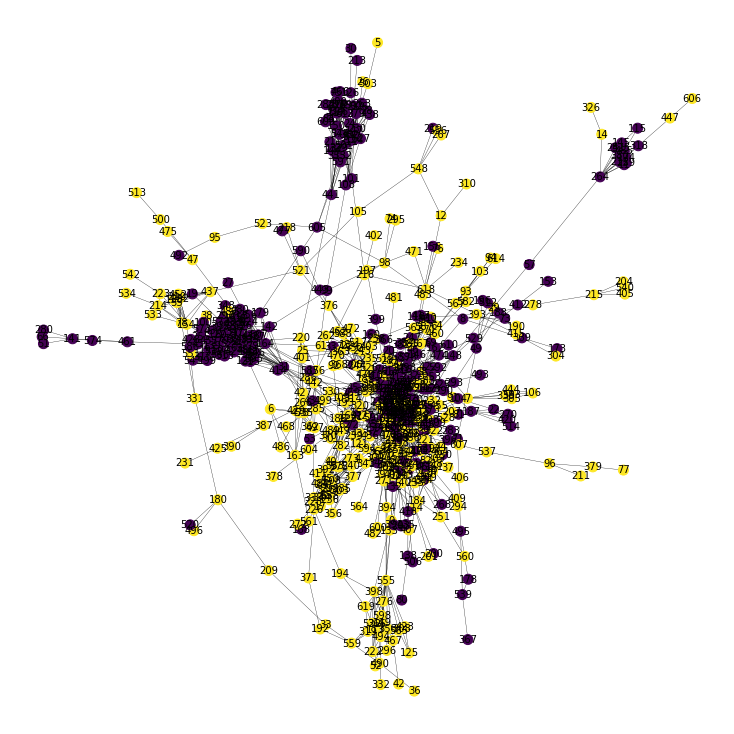

0.3058117818108077


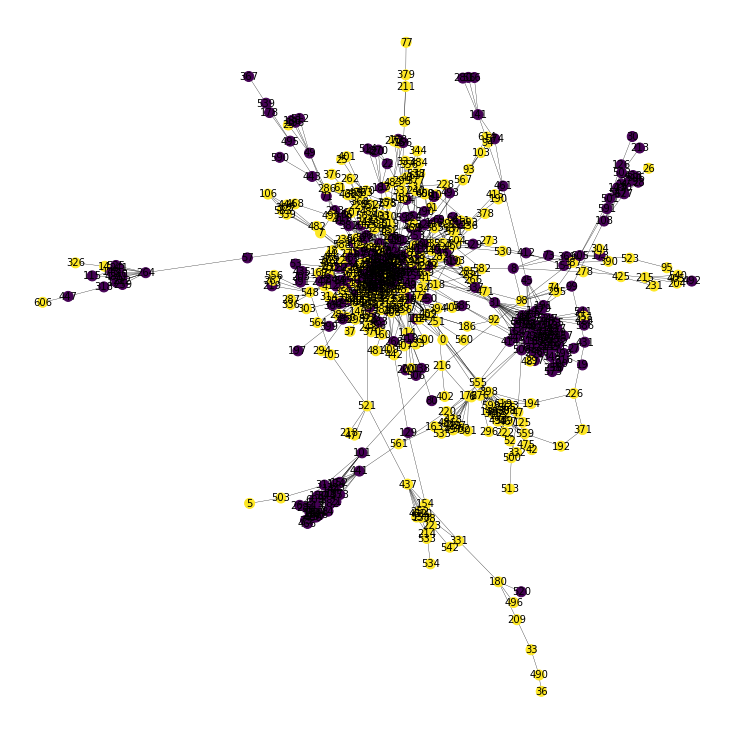

0.3067632565967259


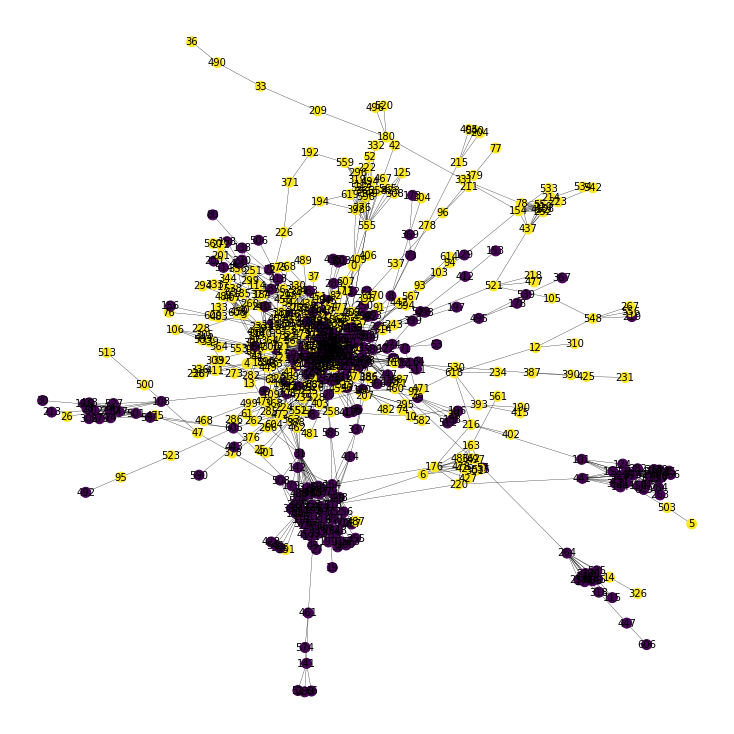

0.30771473138264405


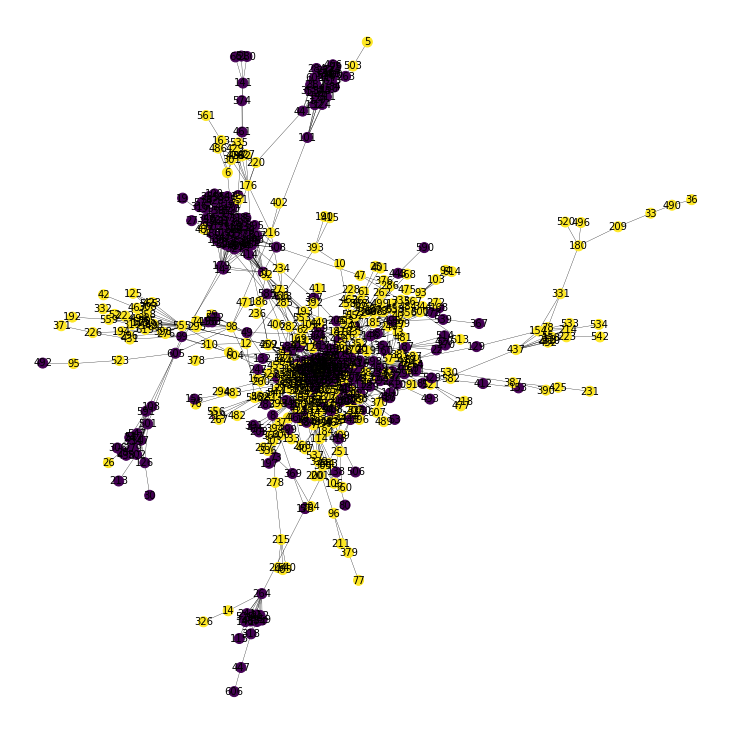

0.3088857424536099


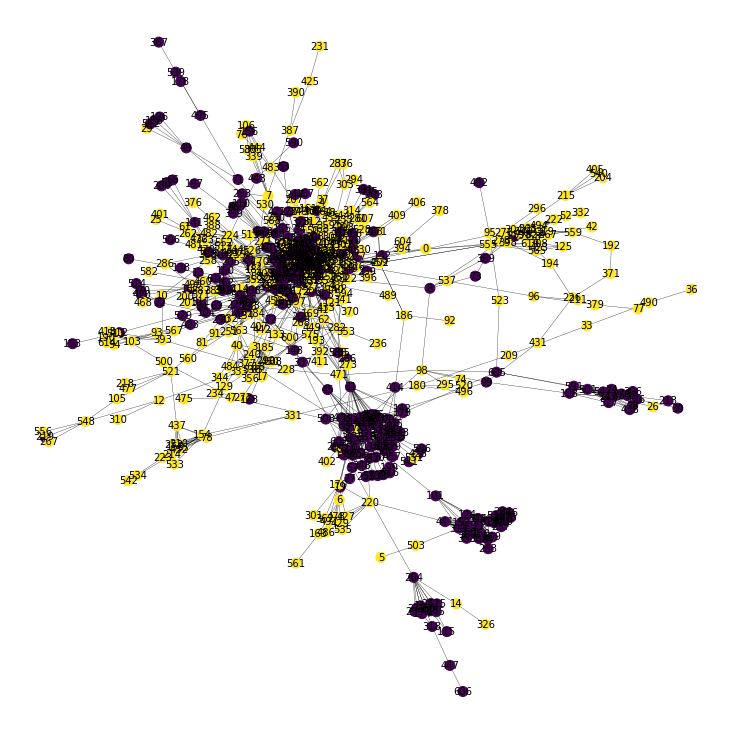

0.3104903942690619


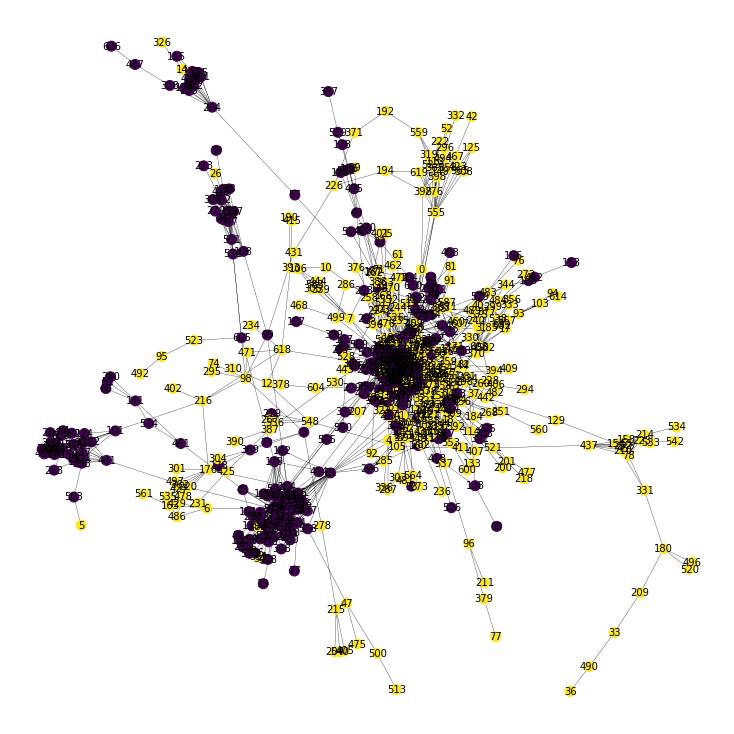

0.31171787369375903


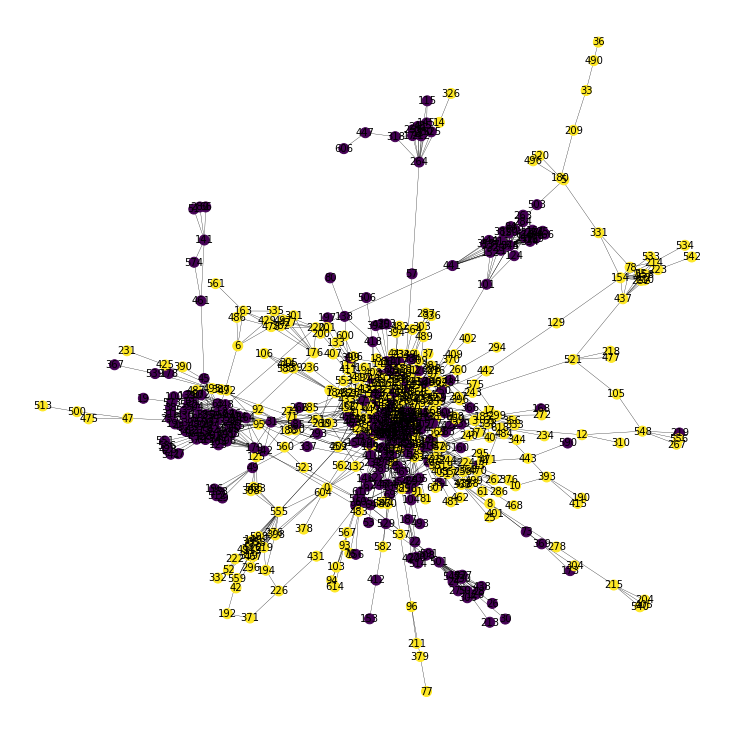

0.31195879779214397


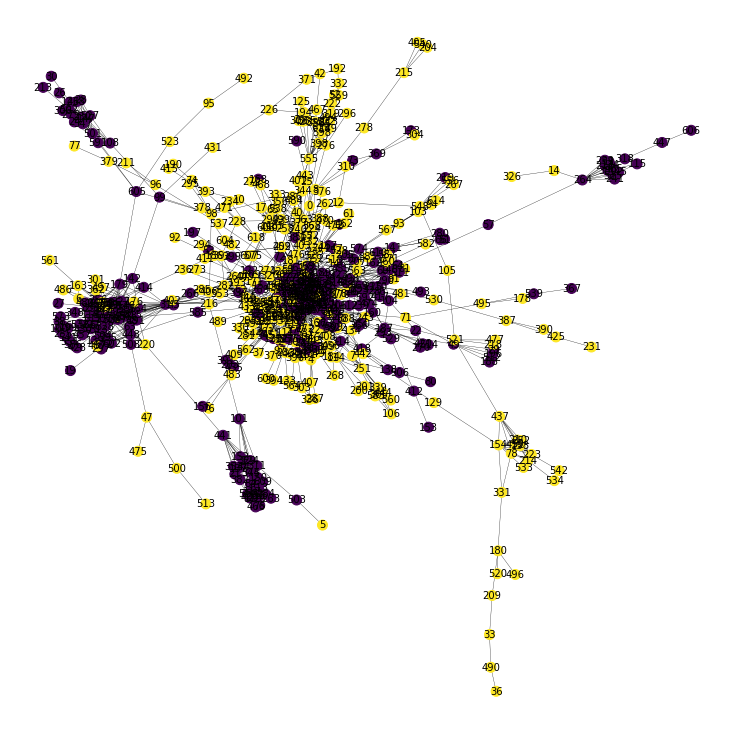

0.3161182182525636


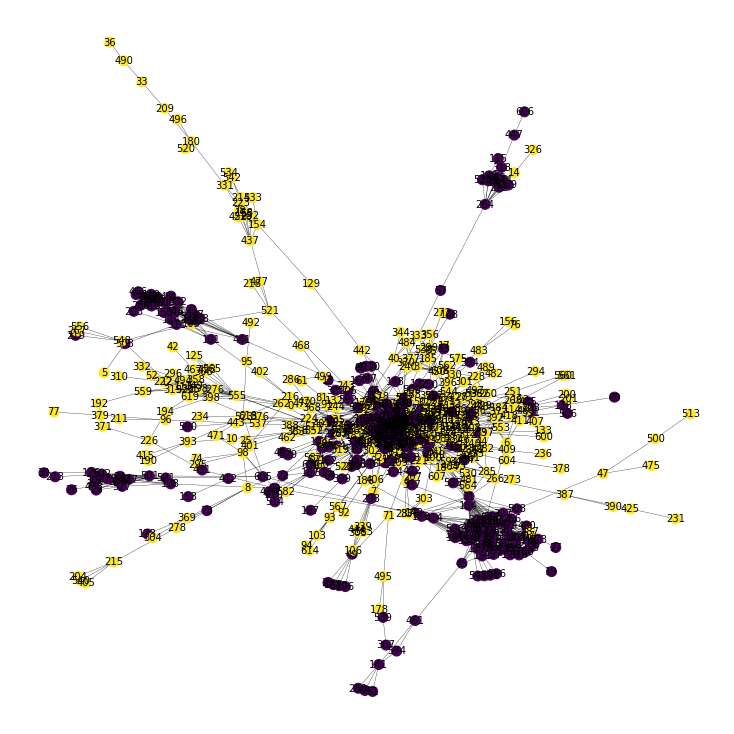

In [40]:
part_0 = partition_init(D)
options = {'node_size': 100,'width': 0.3,'with_labels':True,'font_weight':3,'font_size':10}

for i in range(10000):
    
    modul = modularity_of_a_partition(D, part_0)
    #print(modul[0])
    part_0 = modul[1]
    
    if  i %5200  == 0 :
        print(modul[0])

        plt.figure(figsize = (10,10))
        nx.draw(D, node_color=list(part_0.values()),**options); plt.show()








Here is a clearer view of the solutions we got, the last graph gives a solution with an evident split

-0.007824544790381333


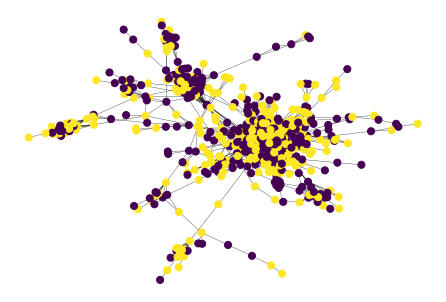

0.2928042569217302


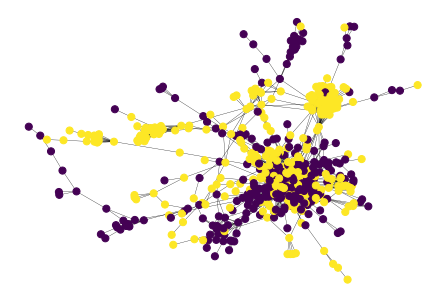

0.32143903092609905


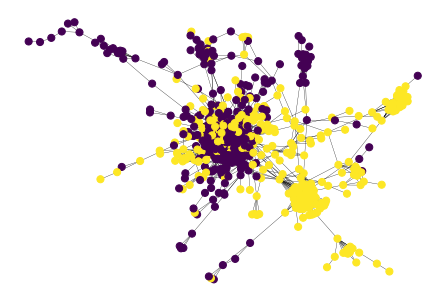

0.3373959239580627


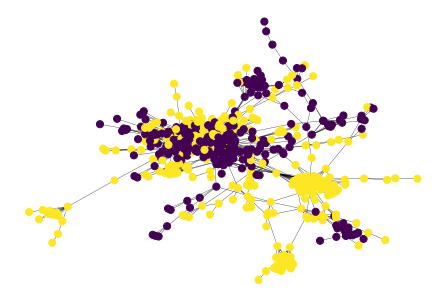

0.3398127468651576


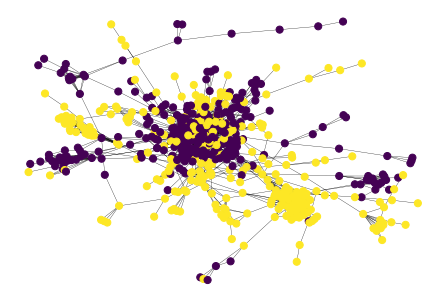

0.3418659769455215


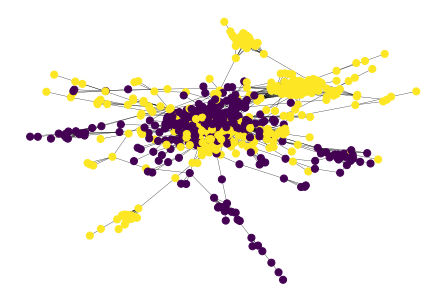

0.3431808182321037


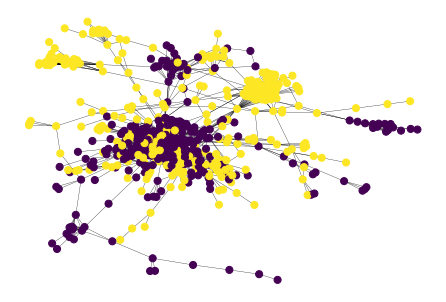

0.3449742259874833


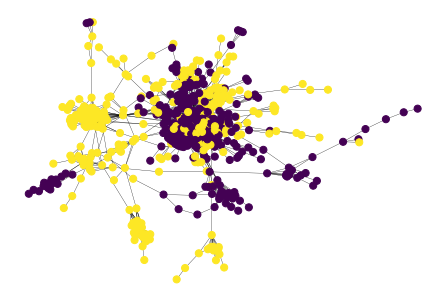

0.34572743913865744


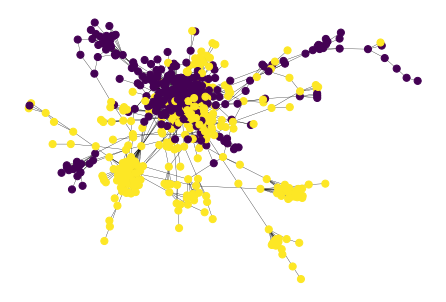

0.3464336896309166


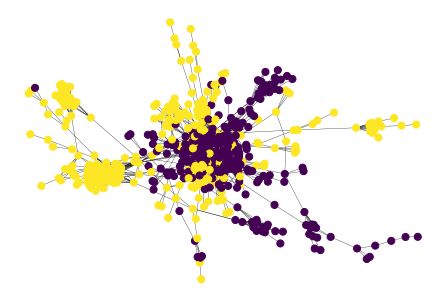

0.3476303887104938


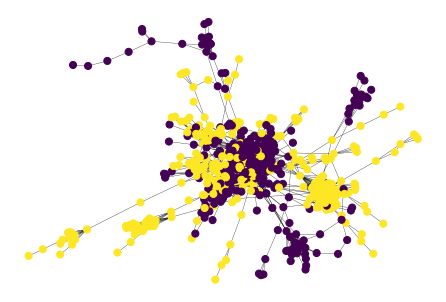

0.34858186349641196


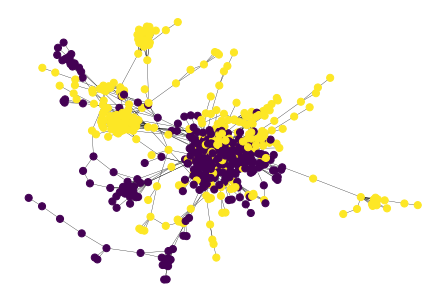

0.34858186349641196


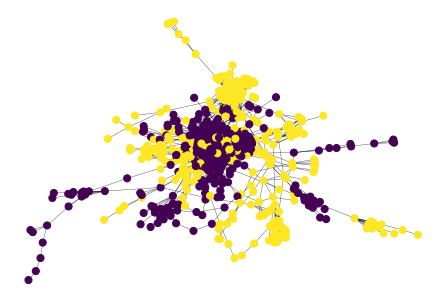

0.34858186349641196


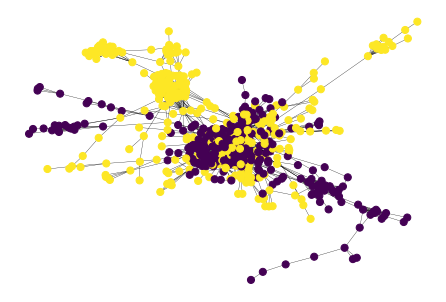

0.3486488560122615


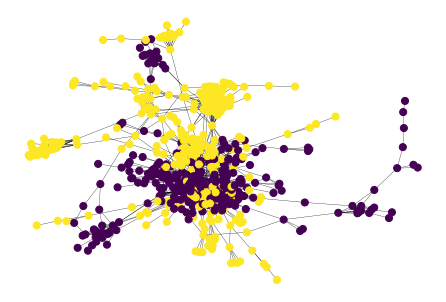

0.3486488560122615


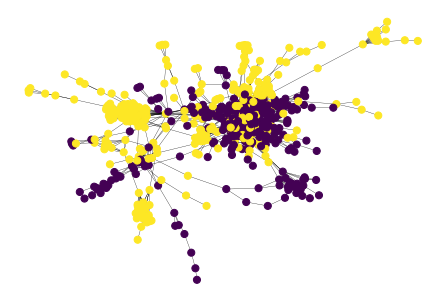

0.3486488560122615


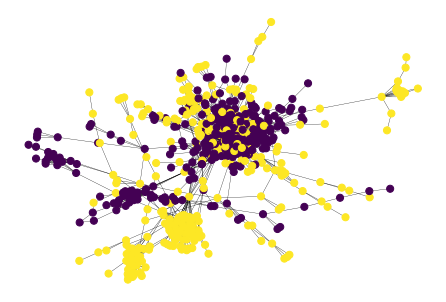

0.3486488560122615


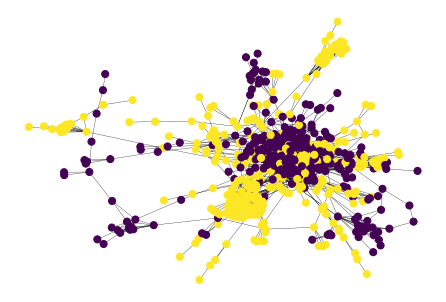

0.3486488560122615


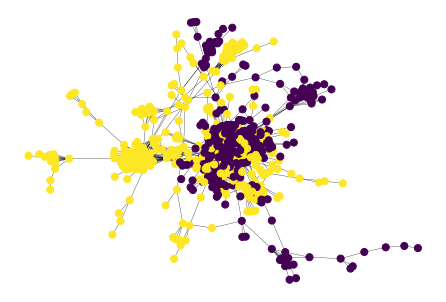

0.3486488560122615


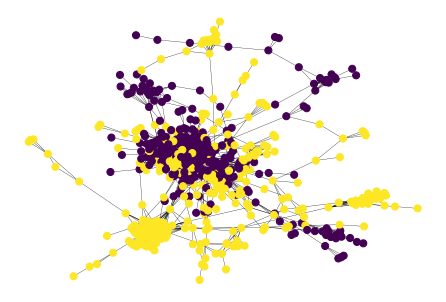

In [41]:
part_0 = partition_init(D)

for i in range(100000):
    
    modul = modularity_of_a_partition(D, part_0)
    #print(modul[0])
    part_0 = modul[1]
    
    if  i %5200  == 0 :
        print(modul[0])

        nx.draw(D, node_color=list(part_0.values()),node_size= 50,width= 0.3); plt.show()

### Improving the solution
We improve the solution using some memory to store the partition that have beeen already tried but have a worse performance. The aim of this function is to save partitions that have been already tried but they perform worse than the existing, If the partition is inside this set, we don't use this solution. That way we strive to optimise the time of computing in order to arrive to the best solution possible.

It can be seen the new iterations with the use of the new "modularity of partition prob" that are later plotted. It also shows that the solutions are fairly similar to the ones we already got.


The results with our network are literally better in comparison to the modularity coming from the splitting of the network in TWO communities. At the end we can properly see a better splitting.



Here, the point is that we need a certain kind of simulated annealing which is the iteration shown above. The problem is that we are taking the best solutions but when there is no best solution, we should add some kind of probability in which the bad solution does not appear anymore.

In [85]:


def modularity_of_a_partition_prob(graph , partition):
    
    bad_choices = []
    old_partition = partition
    new_partition = partition_one_change(graph, partition)
    old_mod = modularity(old_partition,graph, weight='weight')
    if new_partition not in bad_choices: 
        new_mod = modularity(new_partition,graph,  weight='weight')
    
    if new_mod > old_mod:
        mod = new_mod
        part = new_partition
    else :
        mod = old_mod
        part = old_partition# add some probabilty to this choise
        bad_choices.append(part)
  
    return mod,part


Toy network:

-0.04569362261669954


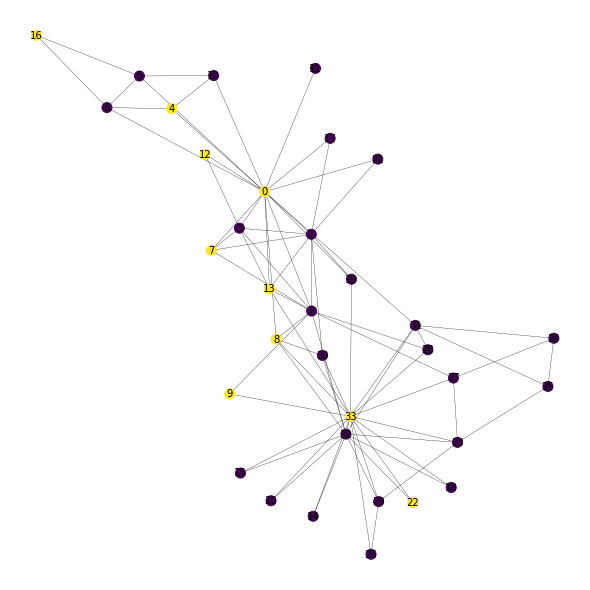

0.15351742274819186


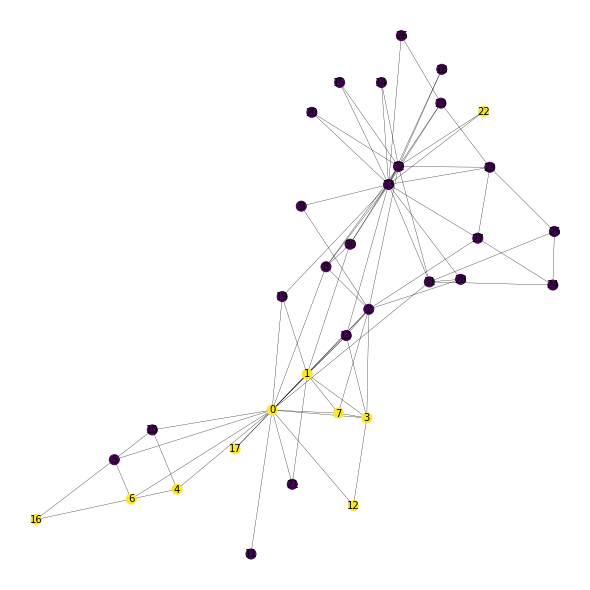

In [45]:
part_0 = partition_init(B)
options = {'node_size': 100,'width': 0.3,'with_labels':True,'font_weight':3,'font_size':10}

for i in range(100):
    
    modul = modularity_of_a_partition_prob(B, part_0)
    #print(modul[0])
    part_0 = modul[1]
    
    if  i %50  == 0 :
        print(modul[0])

        plt.figure(figsize = (8,8))
        nx.draw(B, node_color=list(part_0.values()),**options); plt.show()

Our network:

0.0013117858846769248


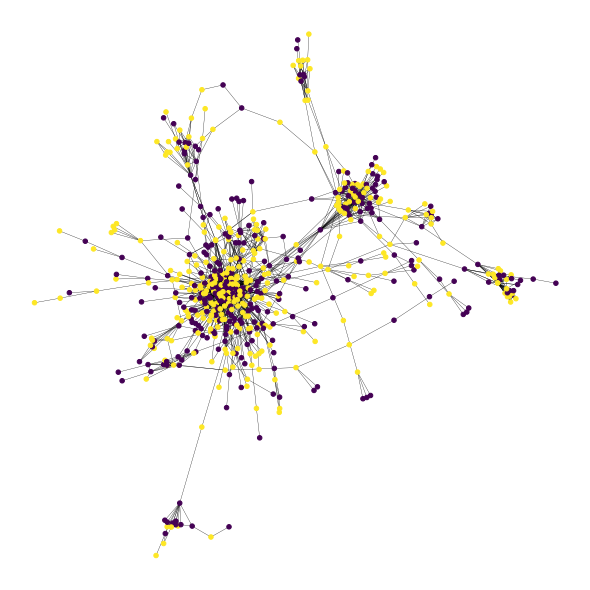

0.07752380723899399


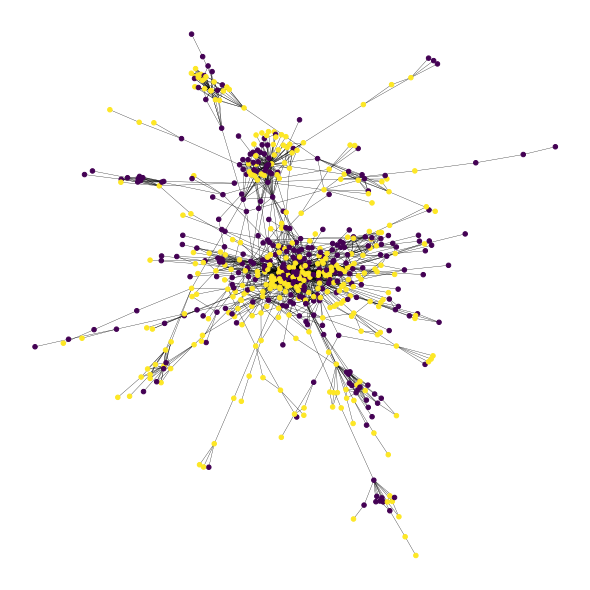

In [46]:
part_0 = partition_init(D)
options = {'node_size': 20,'width': 0.3,'font_weight':3,'font_size':10}

for i in range(1000):
    
    modul = modularity_of_a_partition_prob(D, part_0)
    #print(modul[0])
    part_0 = modul[1]
    
    if  i %500  == 0 :
        print(modul[0])

        plt.figure(figsize = (8,8))
        nx.draw(D, node_color=list(part_0.values()),**options); plt.show()

### Other idea - Random initializing using a threshold

We also of putting a threshold so that you always start with a certain value of modularity. This will help not to lose time computing some values that can be randomly pre-defined to start with.

The idea will be to use a treshold and initialize randomly as many time as possible until this threshold is reached.


-0.014081215751207965
-0.015229141563333659
-0.0005241711713098174
0.0031286183879971063
0.0051637423829961615
Modularity: 0.012333412698340929
Modularity: 0.012333412698340929, Iteration:0


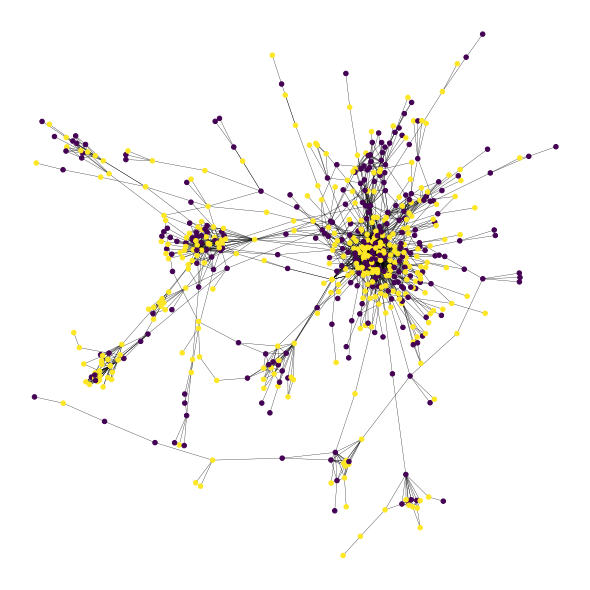

In [ ]:
part_0 = partition_init(D)
while modularity_of_a_partition_prob(D, part_0)[0] < 0.01:
    print(modularity_of_a_partition_prob(D, part_0)[0])
    part_0 = partition_init(D)


print('Modularity:' ,modularity_of_a_partition_prob(D, part_0)[0])
for i in range(10000):
    
    modul = modularity_of_a_partition_prob(D, part_0)
    #print(modul[0])
    part_0 = modul[1]
    
    if  i %5000 == 0 :
        print('Modularity: {}, Iteration:{}'.format(modul[0],i))

        plt.figure(figsize = (8,8))
        nx.draw(D, node_color=list(part_0.values()),**options); plt.show()